In [1]:
%matplotlib notebook
import numpy as np
import pandas as pd
import os
from dv import AedatFile
import matplotlib.pyplot as plt
from matplotlib import animation 
from mpl_toolkits.mplot3d import Axes3D

from sklearn.cluster import DBSCAN
import seaborn as sns

In [2]:
#파일 하나당 한 클래스 사용
class clustering:
    def __init__(self, frame_size = 40000):
        self.frame_size = frame_size
        self.events = None
        self.df = None
        self.start_time = 0
        
        
    def read_aedat_file(self, path):
        with AedatFile(path) as f:
            events = np.hstack([packet for packet in f['events'].numpy()])
            timestamps, x, y, polarities = events['timestamp'], events['x'], events['y'], events['polarity']
            self.events = events
            self.timestamp_zeroization()
            self.dflization()
            return events
        
        
    def timestamp_zeroization(self):
        temp = self.events['timestamp'][0]
        for i in range(0,len(self.events['timestamp'])):
            self.events['timestamp'][i]-=temp
            
    def dflization(self):
        self.df = pd.DataFrame(self.events)
    #이 위에는 한번만 호출해야함 이아래는 
            
    def cut_frame(self,start_time=0):
        end_condition = self. df['timestamp'] <= start_time+self.frame_size
        start_condition = self.df['timestamp'] >= start_time
        print('end_condition : {}'.format(end_condition))
        print('start_condition : {}'.format(start_condition))
        target_df = self.df[end_condition & start_condition]
        a = target_df.reset_index(drop=True)
        a = self.time_nomalization(a)
        return a
    
    def time_nomalization(self,frame):
        temp=self.frame_size/150
        cpy=pd.DataFrame.copy(frame)
        for i in range(len(frame)):
            cpy['timestamp'][i] = frame['timestamp'][i]/temp
        return cpy
    
    def make_model(self,feature, eps=17,min_samples=100):
        model = DBSCAN(eps=eps,min_samples=min_samples)
        predict = pd.DataFrame(model.fit_predict(feature))
        predict.columns=['predict']
        # concatenate labels to df as a new column
        r = pd.concat([feature,predict],axis=1)
        return r
    
        
        #그리기
    
def draw(r):
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.scatter(r['x'],r['y'],r['timestamp'],c=r['predict'],alpha=0.5)
    ax.view_init(270,270)
    ax.set_xlabel('Sepal lenth')
    ax.set_ylabel('Sepal width')
    ax.set_zlabel('Petal length')
    
    plt.show()
    return r
        
def save(r,i):
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.scatter(r['x'],r['y'],r['timestamp'],c=r['predict'],alpha=0.5)
    ax.view_init(270,270)
    ax.set_xlabel('Sepal lenth')
    ax.set_ylabel('Sepal width')
    ax.set_zlabel('Petal length')
    plt.savefig("./save/a/test{}.png".format(i))

In [3]:
test1 = clustering()

In [4]:
test1.read_aedat_file('./predata/newdata.aedat4')

array([(       0, 207, 256, 0, 0, 0), (      14, 132, 241, 1, 0, 0),
       (      28, 304, 141, 0, 0, 0), ..., (10599866, 101, 251, 1, 0, 0),
       (10599880, 174,  35, 1, 0, 0), (10599997, 199,  55, 1, 0, 0)],
      dtype=[('timestamp', '<i8'), ('x', '<i2'), ('y', '<i2'), ('polarity', 'i1'), ('_p1', '<i2'), ('_p2', 'i1')])

In [5]:
target = test1.cut_frame()

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          True
1          True
2          True
3          True
4          True
           ... 
1381006    True
1381007    True
1381008    True
1381009    True
1381010    True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [6]:
p1 = test1.make_model(target)

<IPython.core.display.Javascript object>


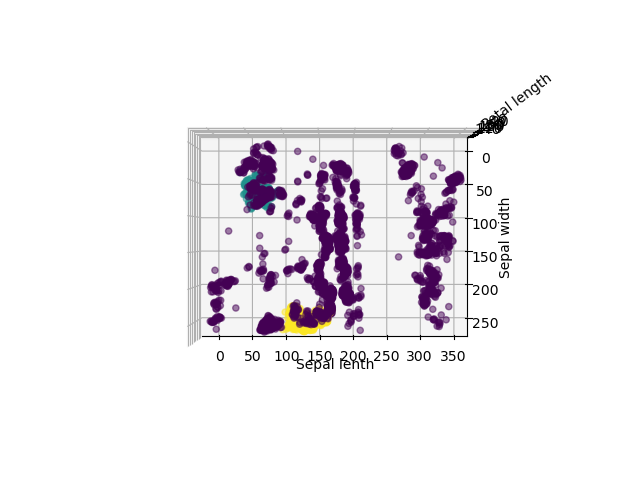

,timestamp,x,y,polarity,_p1,_p2,predict
0,0,207,256,0,0,0,-1
1,0,132,241,1,0,0,1
2,0,304,141,0,0,0,-1
3,0,65,74,1,0,0,0
4,0,114,240,1,0,0,1
...,...,...,...,...,...,...,...
5824,149,300,112,0,0,0,-1
5825,149,181,102,1,0,0,-1
5826,149,164,145,1,0,0,-1
5827,149,327,128,1,0,0,-1


In [7]:
draw(p1)

In [9]:
p1

,timestamp,x,y,polarity,_p1,_p2,predict
0,0,207,256,0,0,0,-1
1,0,132,241,1,0,0,1
2,0,304,141,0,0,0,-1
3,0,65,74,1,0,0,0
4,0,114,240,1,0,0,1
...,...,...,...,...,...,...,...
5824,149,300,112,0,0,0,-1
5825,149,181,102,1,0,0,-1
5826,149,164,145,1,0,0,-1
5827,149,327,128,1,0,0,-1


In [10]:
pd.set_option('display.max_seq_items', None)
# row 생략 없이 출력
pd.set_option('display.max_rows', None)
# col 생략 없이 출력
pd.set_option('display.max_columns', None)


#판다스 배열들의 리스트 만들기
cname = ['timestamp','x','y','polarity','_p1','_p2','predict']


r_list = []

#검출한거 개수만큼 미리 리스트 만들어놓기
r_list_size = p1['predict'].max(axis=0)
for j in range(r_list_size+1):
    newp = pd.DataFrame(columns=cname)
    r_list.append(newp)

for i in p1.index:
    #print(p1.loc[i].values)
    s=p1.loc[i].values.tolist()
    if p1.loc[i,"predict"] == -1:
        continue
    r_list[p1.loc[i,"predict"]].loc[len(r_list[p1.loc[i,"predict"]])]=s
    
print(r_list)

[    timestamp   x   y polarity _p1 _p2 predict
0           0  65  74        1   0   0       0
1           0  66  76        1   0   0       0
2           0  81  70        1   0   0       0
3           0  60  56        1   0   0       0
4           0  78  63        1   0   0       0
5           0  68  76        1   0   0       0
6           0  62  57        1   0   0       0
7           0  56  83        0   0   0       0
8           1  58  60        1   0   0       0
9           1  59  82        0   0   0       0
10          1  66  74        1   0   0       0
11          1  70  74        1   0   0       0
12          1  66  61        1   0   0       0
13          1  60  58        1   0   0       0
14          1  78  64        1   0   0       0
15          2  57  82        0   0   0       0
16          2  57  53        1   0   0       0
17          2  84  75        1   0   0       0
18          2  59  49        1   0   0       0
19          2  50  56        1   0   0       0
20          

In [16]:
#함수화

#판다스 배열들의 리스트 만들기
def event_output(p1):
    cname = ['timestamp','x','y','polarity','_p1','_p2','predict']


    r_list = []

    #검출한거 개수만큼 미리 리스트 만들어놓기
    r_list_size = p1['predict'].max(axis=0)
    for j in range(r_list_size+1):
        newp = pd.DataFrame(columns=cname)
        r_list.append(newp)

    for i in p1.index:
        #print(p1.loc[i].values)
        s=p1.loc[i].values.tolist()
        if p1.loc[i,"predict"] == -1:
            continue
        r_list[p1.loc[i,"predict"]].loc[len(r_list[p1.loc[i,"predict"]])]=s

    #print(r_list)
    return r_list

In [ ]:
def csv_output(num,r_list):
    #num은 출력될 파일이름(전체에서 파일 순서)
    #r_list는 출력할 df 리스트
    list_size=len(r_list)
    
    for i in rainge(0,list_size):
        df=r_list[i]
        df.to_csv(str(num)+".csv")
        
    #반환값은 새로운 num
    return num+list_size

In [13]:
r_list[0]

,timestamp,x,y,polarity,_p1,_p2,predict
0,0,65,74,1,0,0,0
1,0,66,76,1,0,0,0
2,0,81,70,1,0,0,0
3,0,60,56,1,0,0,0
4,0,78,63,1,0,0,0
5,0,68,76,1,0,0,0
6,0,62,57,1,0,0,0
7,0,56,83,0,0,0,0
8,1,58,60,1,0,0,0
9,1,59,82,0,0,0,0


In [15]:
len(r_list)

2

In [10]:
r_list[0].to_csv("test.csv")

In [83]:
df=r_list[1]

In [88]:
p_xEvent = df['x']
p_yEvent = df['y']
p_pEvent = df['polarity']
p_tEvent = df['timestamp']

In [89]:
xEvent = []
yEvent = []
pEvent = []
tEvent = []

In [93]:
xEvent=p_xEvent.tolist()

In [96]:
print(type(xEvent))

<class 'list'>


In [8]:
target2 = test1.cut_frame(start_time=2000000)

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [9]:
p2 = test1.make_model(target2)

In [10]:
draw(p2)

<IPython.core.display.Javascript object>

,timestamp,x,y,polarity,_p1,_p2,predict
0,7500,53,12,1,0,0,-1
1,7500,196,58,0,0,0,0
2,7500,199,198,1,0,0,-1
3,7500,190,50,1,0,0,0
4,7500,191,54,1,0,0,0
...,...,...,...,...,...,...,...
7070,7649,209,149,0,0,0,-1
7071,7649,151,152,1,0,0,-1
7072,7649,265,14,0,0,0,-1
7073,7649,181,98,1,0,0,-1


In [11]:
for i in range(1,1000):
    size=i*40000
    sg1 = test1.cut_frame(size)
    sg2 = test1.make_model(sg1)
    save(sg2,i)

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0           True
1           True
2           True
3           True
4           True
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


end_condition : 0          True
1          True
2          True
3          True
4          True
           ... 
1381006    True
1381007    True
1381008    True
1381009    True
1381010    True
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006     True
1381007     True
1381008     True
1381009     True
1381010     True
Name: timestamp, Length: 1381011, dtype: bool


C:\Users\sslab\anaconda3\envs\visual\lib\site-packages\ipykernel_launcher.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>

end_condition : 0          True
1          True
2          True
3          True
4          True
           ... 
1381006    True
1381007    True
1381008    True
1381009    True
1381010    True
Name: timestamp, Length: 1381011, dtype: bool
start_condition : 0          False
1          False
2          False
3          False
4          False
           ...  
1381006    False
1381007    False
1381008    False
1381009    False
1381010    False
Name: timestamp, Length: 1381011, dtype: bool


ValueError: Found array with 0 sample(s) (shape=(0, 6)) while a minimum of 1 is required.